In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from utils.utilities import get_engine
from datetime import datetime
from dateutil.relativedelta import relativedelta
import pandas as pd

In [3]:
engine = get_engine()

In [4]:
# Get 1 year data
end_date = datetime.today().date()
start_date = end_date - relativedelta(years = 1)


In [5]:
# get efficient frontier optimization on HSX
query = f"""
    SELECT
        stock_code,
        date,
        close_price
    FROM public.transaction
    WHERE 
        stock_exchange = 'HSX'
        AND
        date >= DATE '{start_date}'
        AND
        date <= DATE '{end_date}'
"""
df = pd.read_sql_query(query, engine)
df

,stock_code,date,close_price
0,ELC,2021-06-11,14.65
1,VNL,2021-06-25,19.10
2,VNM,2021-06-25,89.70
3,VNS,2021-06-25,9.58
4,VOS,2021-06-25,8.42
...,...,...,...
89902,VSH,2021-07-13,20.95
89903,VTB,2021-07-13,10.85
89904,VTO,2021-07-13,9.03
89905,YBM,2021-07-13,6.66


In [6]:
stocks = df['stock_code'].unique()
close_data = None
for stock in stocks:
    stock_data = df[df['stock_code'] == stock][['date', 'close_price']]
    stock_data.index = stock_data['date']
    stock_data = stock_data.drop('date', axis = 1).sort_index()
    stock_data = stock_data.rename(columns = {
        'close_price' : stock
    })
    if close_data is None:
        close_data = stock_data
    else:
        close_data = close_data.merge(stock_data, how = 'outer', left_index = True, right_index = True)

In [7]:
close_data = close_data.fillna(0.0)

In [8]:
close_data

,ELC,VNL,VNM,VNS,VOS,VPB,VPD,VPG,VPH,VPI,...,S4A,HU3,TS4,L10,HRC,CLW,THI,CLG,ATG,DIC
date,,,,,,,,,,,,,,,,,,,,,
2020-07-15,5.67,0.0,93.1197,12.4151,1.47,22.50,13.1602,11.7863,4.22,33.24,...,27.0004,6.9849,3.55,0.0000,39.90,0.0,0.0000,1.44,0.84,1.61
2020-07-16,5.65,0.0,94.3239,12.6467,1.46,22.60,13.1602,11.6970,4.35,33.16,...,27.0486,6.5371,3.35,0.0000,38.05,0.0,26.1198,1.40,0.84,1.72
2020-07-17,5.65,0.0,93.7619,12.6004,1.46,23.05,13.6302,11.7863,4.35,33.24,...,0.0000,6.5551,3.17,11.9265,39.95,0.0,25.5394,1.38,0.82,1.62
2020-07-20,5.54,0.0,92.8789,12.3000,1.45,22.70,13.5362,11.2505,4.25,33.32,...,0.0000,6.8237,3.12,12.7596,42.70,0.0,0.0000,1.38,0.77,1.52
2020-07-21,5.40,0.0,93.1197,11.4500,1.48,22.75,0.0000,11.1613,4.23,33.28,...,0.0000,6.7163,3.30,0.0000,42.70,0.0,24.5236,1.39,0.78,1.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-07-07,15.45,19.0,89.8000,9.3000,7.09,70.70,0.0000,36.1500,5.50,35.00,...,26.8000,0.0000,0.00,0.0000,0.00,0.0,0.0000,0.00,0.00,0.00
2021-07-08,14.95,18.5,88.4000,9.2000,7.20,69.30,14.4000,37.9000,5.52,35.05,...,26.5000,7.9100,0.00,16.0000,60.00,0.0,0.0000,0.00,0.00,0.00
2021-07-09,14.70,19.1,87.0000,9.0800,6.90,68.80,13.9000,37.3000,5.32,34.75,...,26.5000,0.0000,0.00,15.0500,0.00,0.0,0.0000,0.00,0.00,0.00


In [9]:
# Choose stocks for optimizing
stock_lists = ['ACB', 'FPT', 'VIC', 'VNM']
choosen_close_data = close_data[stock_lists]

In [34]:
from analysis.modules.efficient_frontier import *
num_portfolios = 25000
risk_free_rate = 0.013 #1.3%

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.95
Annualised Volatility: 149.04


              ACB   FPT   VIC    VNM
allocation  67.67  1.89  0.07  30.37
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.15
Annualised Volatility: 83.96


             ACB    FPT   VIC   VNM
allocation  1.81  19.99  5.09  73.1


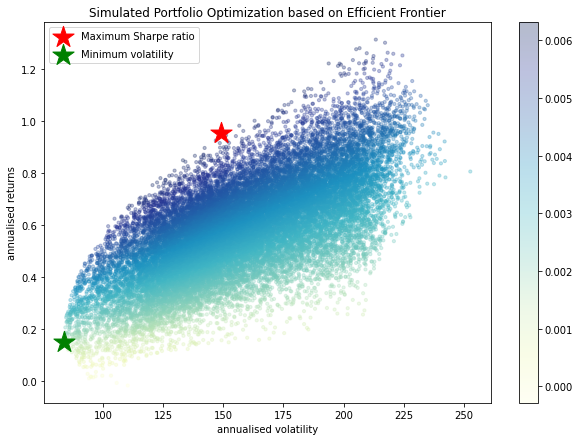

In [22]:
display_simulated_ef_with_random(choosen_close_data, num_portfolios, risk_free_rate)

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 1.01
Annualised Volatility: 155.84


              ACB  FPT  VIC    VNM
allocation  72.53  0.0  0.0  27.47
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 82.98


            ACB    FPT  VIC    VNM
allocation  0.0  26.43  0.0  73.57


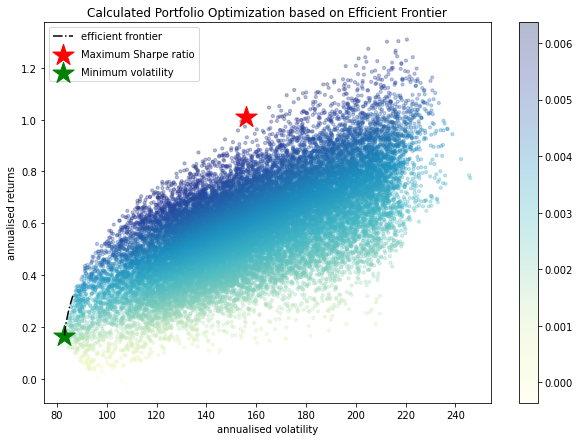

In [29]:
display_calculated_ef_with_random(choosen_close_data, num_portfolios, risk_free_rate)

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 1.01
Annualised Volatility: 155.84


              ACB  FPT  VIC    VNM
allocation  72.53  0.0  0.0  27.47
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 82.98


            ACB    FPT  VIC    VNM
allocation  0.0  26.43  0.0  73.57
--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

ACB : annuaised return 1.42 , annualised volatility: 1.03
FPT : annuaised return 0.81 , annualised volatility: 1.45
VIC : annuaised return 0.18 , annualised volatility: 0.3
VNM : annuaised return -0.07 , annualised volatility: 0.26
--------------------------------------------------------------------------------


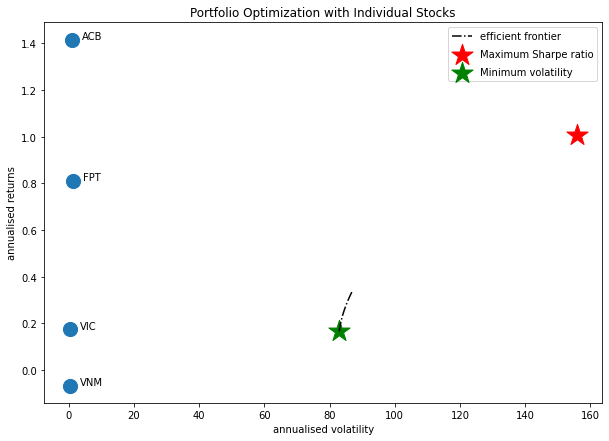

In [36]:
display_ef_with_selected(choosen_close_data, risk_free_rate)